In [23]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
import os
from torchvision.utils import save_image

In [24]:
# choosing the right device on google drive

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [25]:
# connect the google drive

from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [26]:
# image preparation and preprocessing

from torchvision.transforms.transforms import Grayscale
transform = transforms.Compose([
                                transforms.Resize((420, 540)),
                                transforms.Grayscale(num_output_channels=1),
                                transforms.ToTensor()                       
                               ])

train_set = datasets.ImageFolder('/content/drive/MyDrive/DeNoising/train', transform)
train_set_c = datasets.ImageFolder('/content/drive/MyDrive/DeNoising/train_cleaned', transform)

batch_size=16
train_loader = torch.utils.data.DataLoader(train_set, batch_size, drop_last=True)
clean_loader = torch.utils.data.DataLoader(train_set_c, batch_size, drop_last=True)

In [28]:
# ConvAutoencoder

class ConvAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        # encoder 
        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )
        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 16, 3, padding=1),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )
        self.conv3 = nn.Sequential(
            nn.Conv2d(16, 4, kernel_size=3, padding=1),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )

        self.pool = nn.MaxPool2d(2, 2)
        
        #decoder
        self.conv1_t = nn.Sequential(
            nn.ConvTranspose2d(4, 16, kernel_size=3, stride=2, padding=0),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )
        self.conv2_t = nn.Sequential(
            nn.ConvTranspose2d(16, 4, kernel_size=3, stride=1, padding=0),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )
        self.conv3_t = nn.Sequential(
            nn.Conv2d(4, 1, kernel_size=4, stride=1, padding=0),
            nn.LazyBatchNorm2d(),
            nn.SELU()
            )

        

    def forward(self, x):
        # encode
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.pool(x) # ⟸ bottleneck
        
        # decode
        x = self.conv1_t(x)
        x = self.conv2_t(x)
        x = self.conv3_t(x)

        return x


model = ConvAutoencoder().to(device)
summary(model, (1, 420, 540))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 420, 540]             320
       BatchNorm2d-2         [-1, 32, 420, 540]              64
              SELU-3         [-1, 32, 420, 540]               0
            Conv2d-4         [-1, 16, 420, 540]           4,624
       BatchNorm2d-5         [-1, 16, 420, 540]              32
              SELU-6         [-1, 16, 420, 540]               0
            Conv2d-7          [-1, 4, 420, 540]             580
       BatchNorm2d-8          [-1, 4, 420, 540]               8
              SELU-9          [-1, 4, 420, 540]               0
        MaxPool2d-10          [-1, 4, 210, 270]               0
  ConvTranspose2d-11         [-1, 16, 421, 541]             592
      BatchNorm2d-12         [-1, 16, 421, 541]              32
             SELU-13         [-1, 16, 421, 541]               0
  ConvTranspose2d-14          [-1, 4, 4

/usr/local/lib/python3.7/dist-packages/torch/nn/modules/lazy.py:178: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [29]:
#Loss function
criterion = nn.MSELoss()

#Optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.9)

lr_sched = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=5, eta_min=0.05)

optimizer.param_groups[0]["lr"]

0.9

In [30]:
# preparing data for training

tr = []
cl = []
for (data, _) in  train_loader:
    tr.append(data)
for (data, _) in  clean_loader:
    cl.append(data)
all_loader = list(zip(tr,cl))

In [31]:
model.train()

ConvAutoencoder(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv2): Sequential(
    (0): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv3): Sequential(
    (0): Conv2d(16, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1_t): Sequential(
    (0): ConvTranspose2d(4, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv2_t): Sequential(
    (0): ConvTranspose2d(16, 4, kernel_size=(3, 3), st

Epoch: 1 	Training Loss: 39.061489 	lr:0.818832222609353


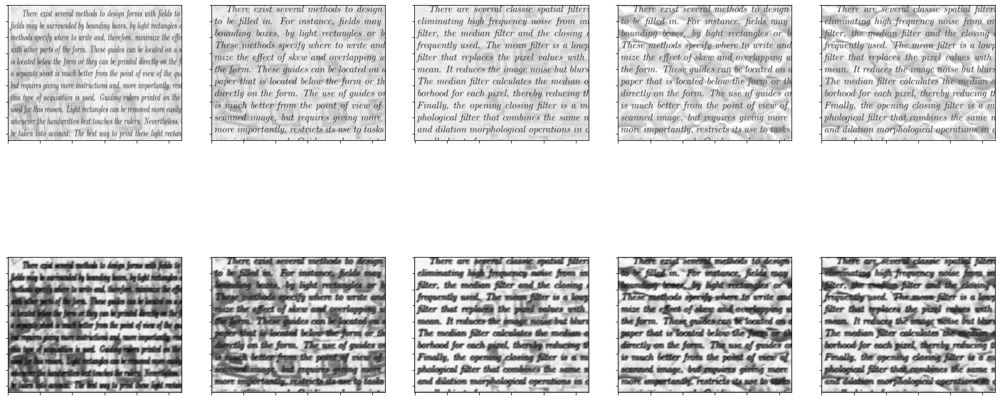

Epoch: 2 	Training Loss: 6.469380 	lr:0.6063322226093532


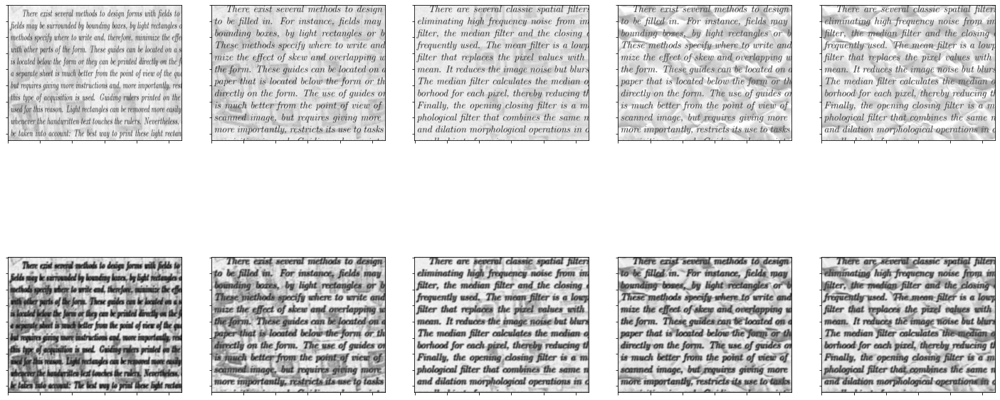

Epoch: 3 	Training Loss: 5.076219 	lr:0.3436677773906475


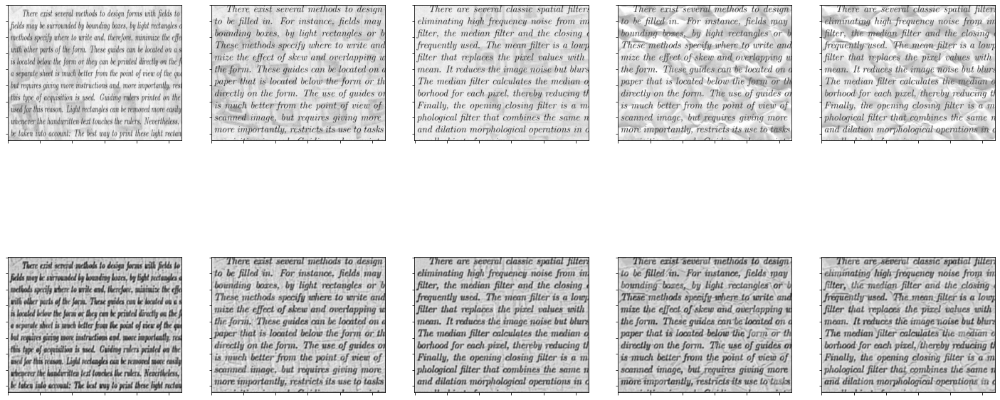

Epoch: 4 	Training Loss: 4.681155 	lr:0.13116777739064733


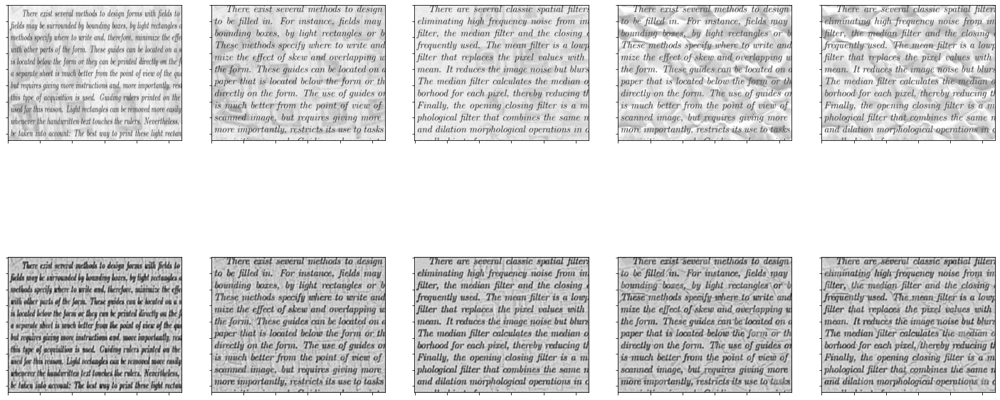

Epoch: 5 	Training Loss: 4.362237 	lr:0.05


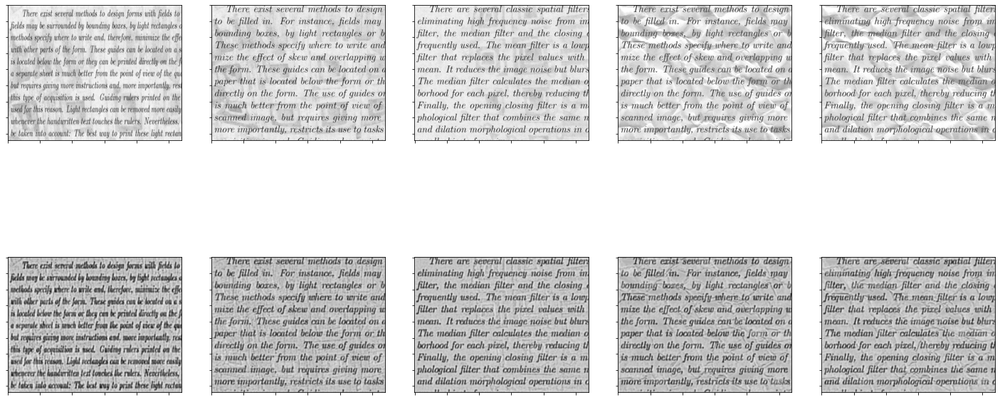

Epoch: 6 	Training Loss: 4.276885 	lr:0.13116777739064794


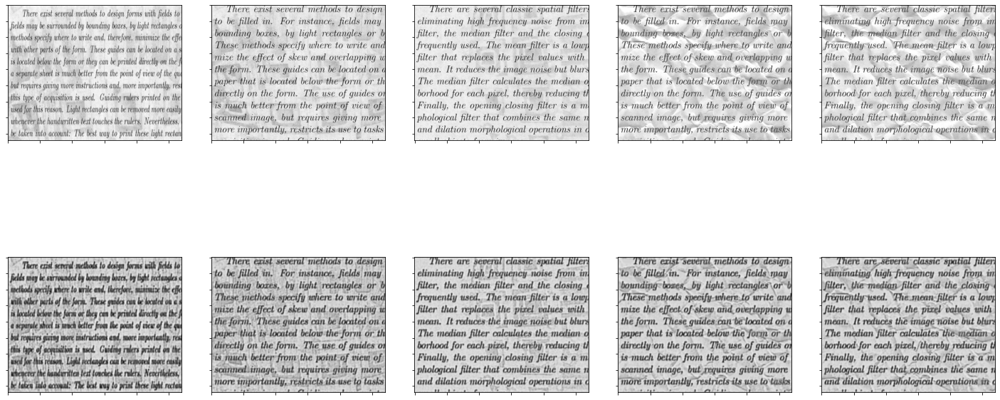

Epoch: 7 	Training Loss: 4.085533 	lr:0.34366777739064774


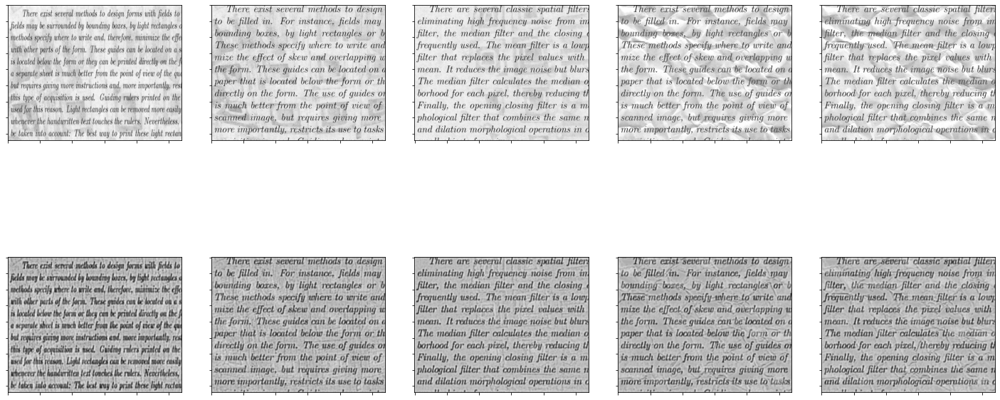

Epoch: 8 	Training Loss: 3.938954 	lr:0.6063322226093559


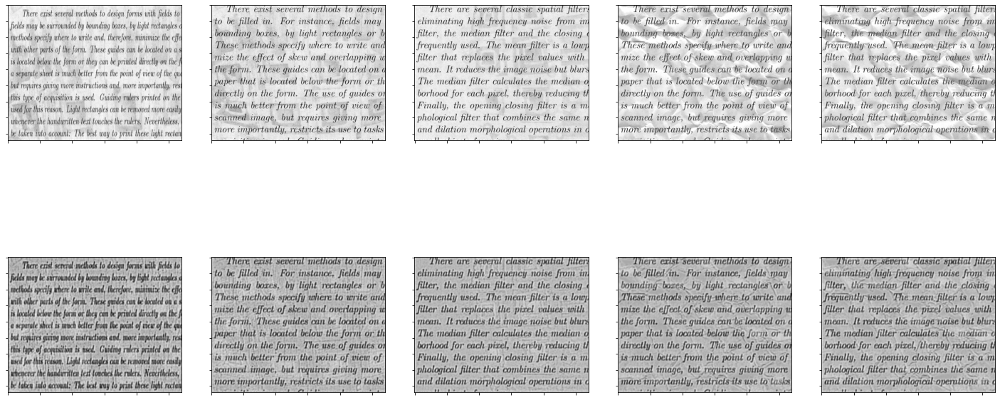

Epoch: 9 	Training Loss: 3.932982 	lr:0.8188322226093584


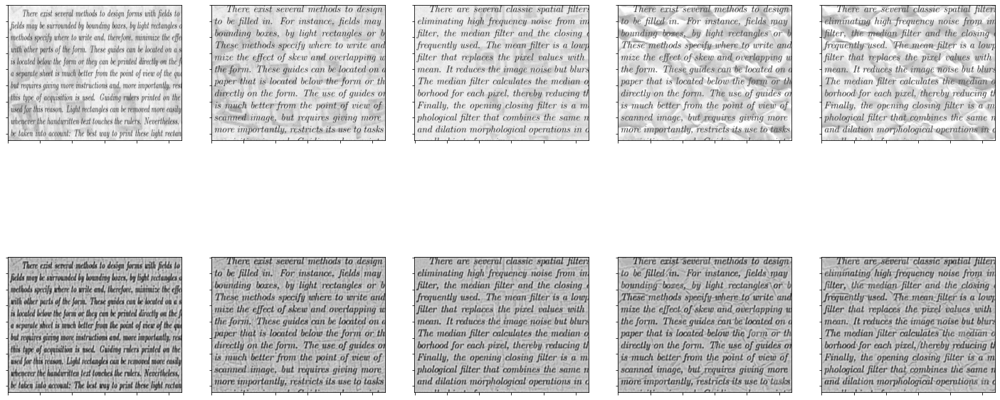

Epoch: 10 	Training Loss: 3.849183 	lr:0.9000000000000055


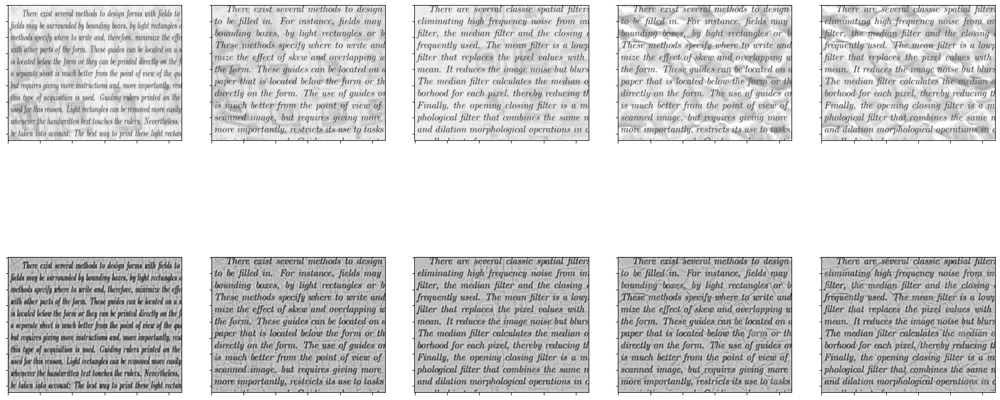

Epoch: 11 	Training Loss: 3.976686 	lr:0.8188322226093584


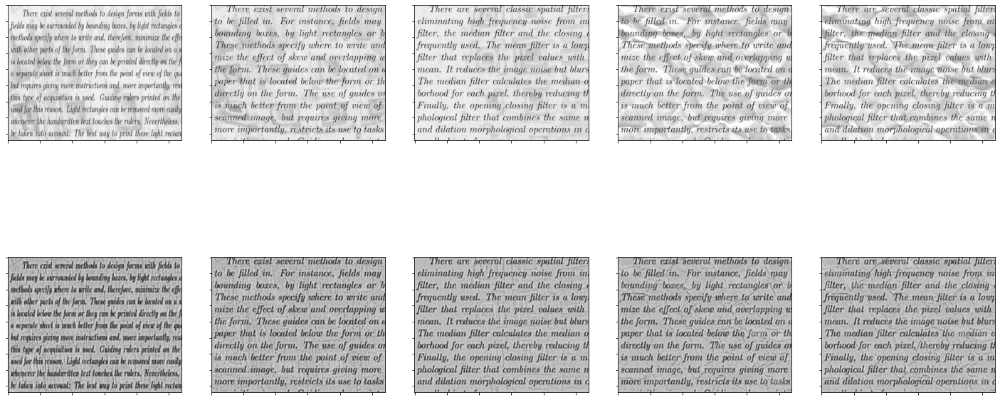

Epoch: 12 	Training Loss: 3.721172 	lr:0.6063322226093437


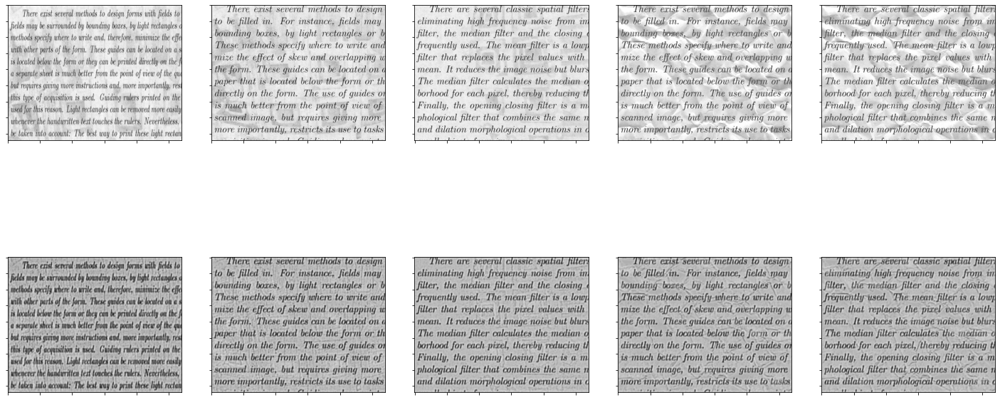

Epoch: 13 	Training Loss: 3.550882 	lr:0.3436677773906502


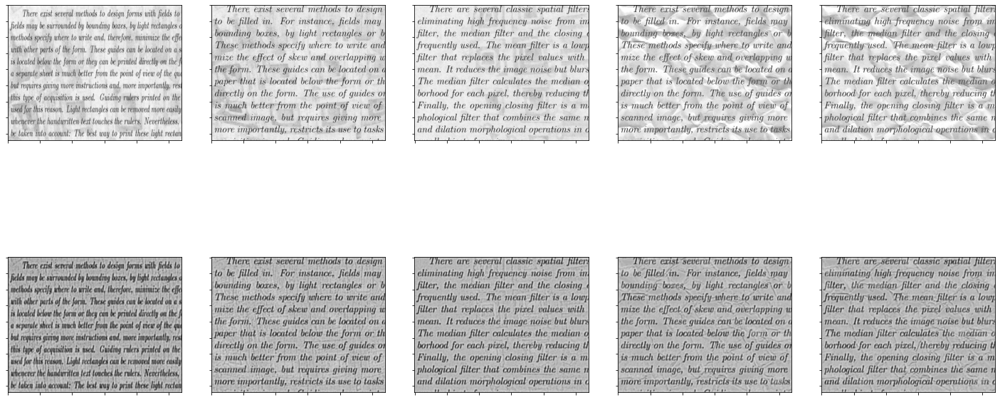

Epoch: 14 	Training Loss: 3.674603 	lr:0.13116777739064733


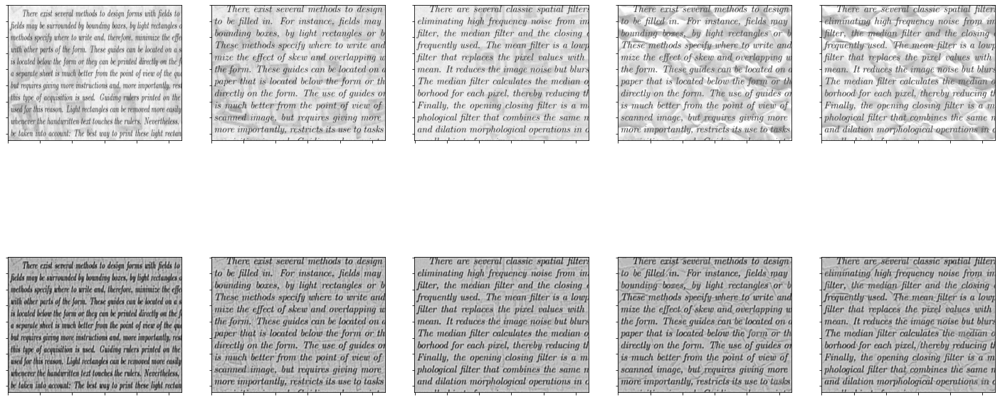

Epoch: 15 	Training Loss: 3.443093 	lr:0.05


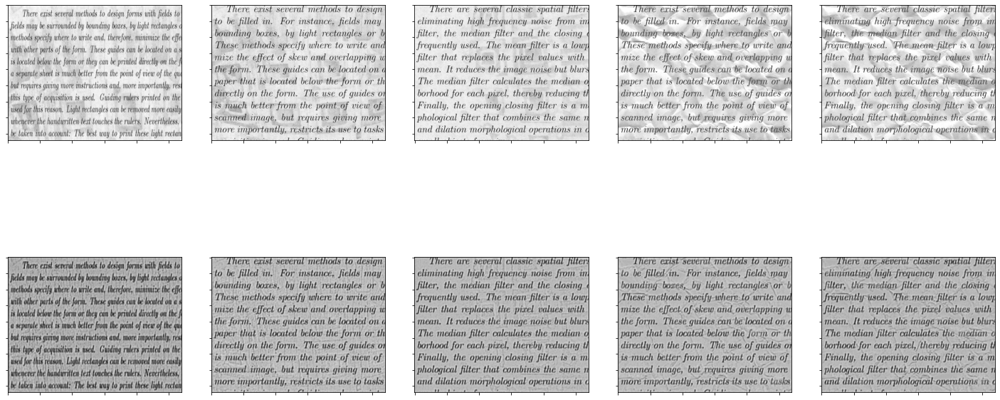

Epoch: 16 	Training Loss: 3.224879 	lr:0.131167777390649


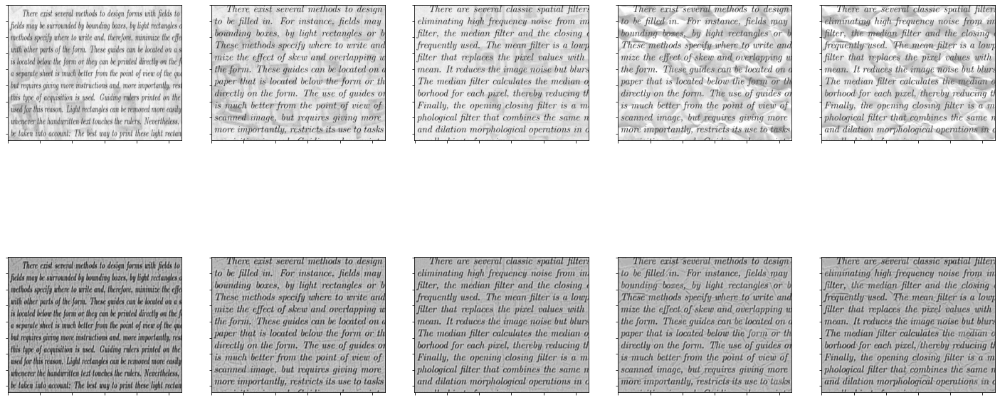

Epoch: 17 	Training Loss: 3.091394 	lr:0.3436677773906569


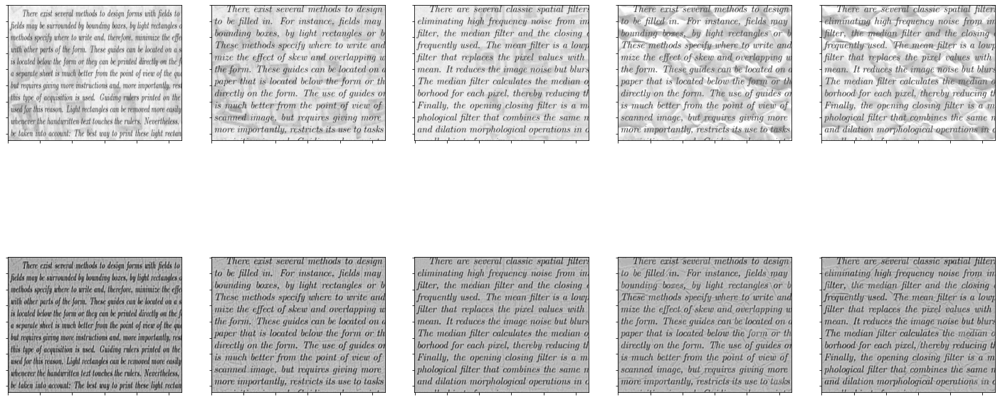

Epoch: 18 	Training Loss: 2.988898 	lr:0.6063322226093636


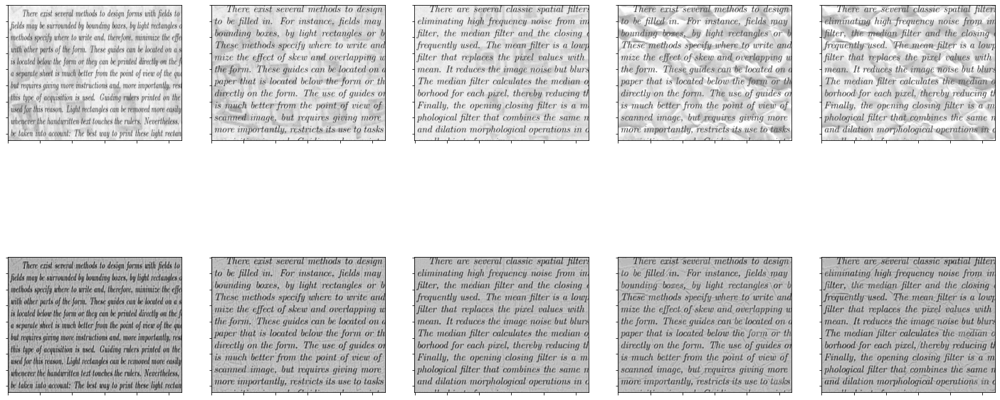

Epoch: 19 	Training Loss: 2.881662 	lr:0.8188322226093474


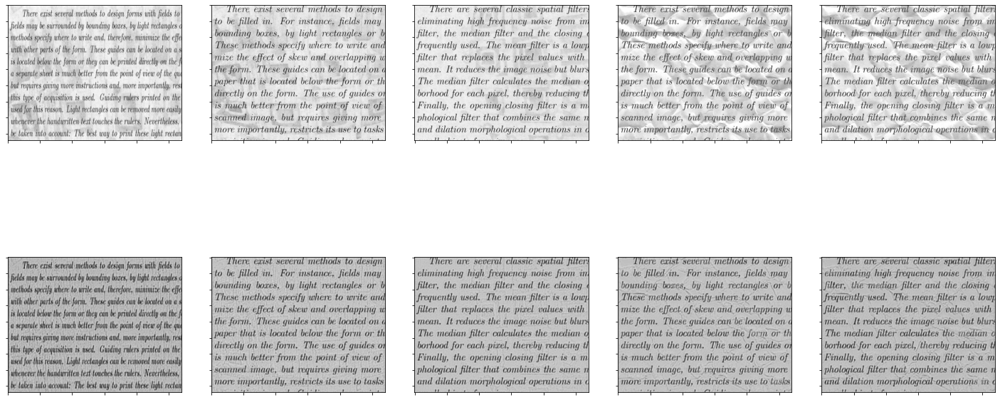

Epoch: 20 	Training Loss: 2.844319 	lr:0.9000000000000486


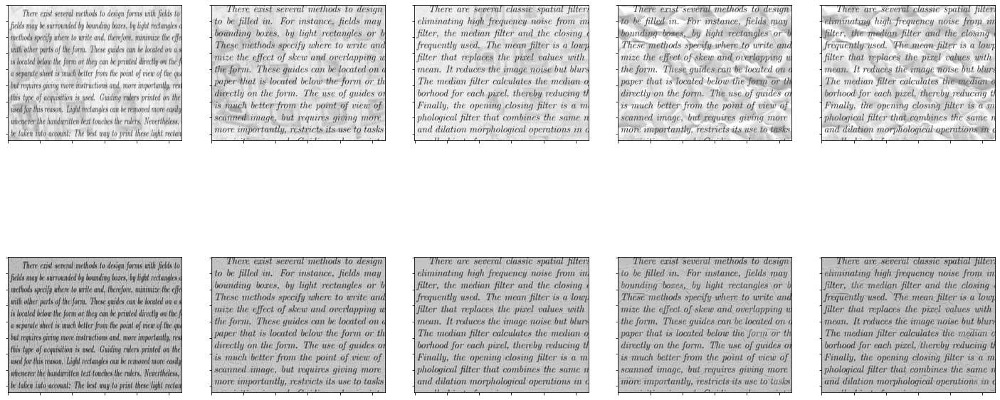

In [32]:
# model training

n_epochs = 20
train_loss=[]
lrs = []
for epoch in range(1, n_epochs+1):

    train_loss_batch = 0.0
    
    for i in range(len(all_loader)):
        images = tr[i]
        optimizer.zero_grad()
        outputs = model(images.to(device))
        loss = criterion(outputs, cl[i].to(device))
        loss.backward()
        optimizer.step()
        lr_sched.step()
        train_loss_batch += loss.item()*images.size(0)
    train_loss.append(train_loss_batch/len(train_loader))
    if epoch % 1 == 0:
        lrs.append(optimizer.param_groups[0]["lr"])
        print(f'Epoch: {epoch} \tTraining Loss: {train_loss_batch:.6f} \tlr:{optimizer.param_groups[0]["lr"]}')

        save_image(outputs.data[0].detach().cpu(), f'/content/drive/MyDrive/DeNoising/results/img{epoch}.jpg')
        fig, ax = plt.subplots(2, 5, figsize=(20, 10))
        fig.tight_layout()
        ax = ax.flatten()
        for pos in range(10):
            if pos < 5:
                ax[pos].imshow(torch.permute(images.data[pos].detach().cpu(), (1, 2, 0)).squeeze(-1), 'gray')
                ax[pos].set_yticklabels([]); ax[pos].set_xticklabels([])
            else:
                ax[pos].imshow(torch.permute(outputs.data[pos-5].detach().cpu(), (1, 2, 0)).squeeze(-1), 'gray')
                ax[pos].set_yticklabels([]); ax[pos].set_xticklabels([])
        plt.show()

In [33]:
model.eval()

ConvAutoencoder(
  (conv1): Sequential(
    (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv2): Sequential(
    (0): Conv2d(32, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv3): Sequential(
    (0): Conv2d(16, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv1_t): Sequential(
    (0): ConvTranspose2d(4, 16, kernel_size=(3, 3), stride=(2, 2))
    (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SELU()
  )
  (conv2_t): Sequential(
    (0): ConvTranspose2d(16, 4, kernel_size=(3, 3), st

In [34]:
import io
import torchvision
#from torchvision.io import read_image
import pandas as pd

In [35]:
# preparing data for uploading to kaggle

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
id = []
value = []
def read_and_preprocess_image(img):
    img = torchvision.io.read_image(img)/255
    img=img.cuda()
    img = img.unsqueeze(0)
    return img

test_names = os.listdir('/content/drive/MyDrive/DeNoising/test/test')
for i in test_names:
    file = '/content/drive/MyDrive/DeNoising/test/test/'+i
    pred = model(read_and_preprocess_image(file)).squeeze(0).squeeze(0).detach().cpu().numpy()
    for row in range(0, pred.shape[0]):
        for col in range(0, pred.shape[1]):
            id.append(f'{i[:-4]}_{row+1}_{col+1}')
            value.append(pred[row, col])
submission = pd.DataFrame({'id' : id, 'value' : value})
submission.to_csv('submissions_X4.csv', header=True, index=False)
print('Done')

Done


In [36]:
submission.shape

(14230080, 2)

In [37]:
submission.head(10)

,id,value
0,28_1_1,1.009288
1,28_1_2,1.041499
2,28_1_3,0.998113
3,28_1_4,0.920655
4,28_1_5,0.926809
5,28_1_6,0.971551
6,28_1_7,0.995583
7,28_1_8,0.964035
8,28_1_9,0.972710
9,28_1_10,0.964522
